<a href="https://colab.research.google.com/github/Dileep2896/computer_vision/blob/main/Face_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Pixels

An image consists of RGB notations to determine it's colors and even the size of the images

* Let say an image has 32 pixels in height and 32 pixels in width then.
  * Size -> 32 x 32 = 1024
  * As RGB consists of 3 values, then.
    * Size -> 32 x 32 x 3 = 3072
* But For a gray scale images the size of the image reduces, because
  * RGB are same for all the pixels hence the values reduces from 3 -> 1, then.
    * Size -> 32 * 32 = 1024

**Hence, a color image is of more size than a gray scale image.**

# Cascade Classifier

Cascading classifiers are trained with several hundred "positive" sample views of a particular object and arbitrary "negative" images of the same size. ... After the classifier is trained it can be applied to a region of an image and detect the object in question.

**Cascade Classifier is a feature of OpenCV**



## Let's get started

### Import Images

In [1]:
# importing OpenCV library
import cv2

In [2]:
# importing datasets from google drive
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [3]:
# Reading image using opencv
image = cv2.imread("/content/drive/MyDrive/Computer Vision Masterclass/Images/people1.jpg")

In [ ]:
image.shape

(1280, 1920, 3)

In [ ]:
cv2.imshow(image)

DisabledFunctionError: ignored

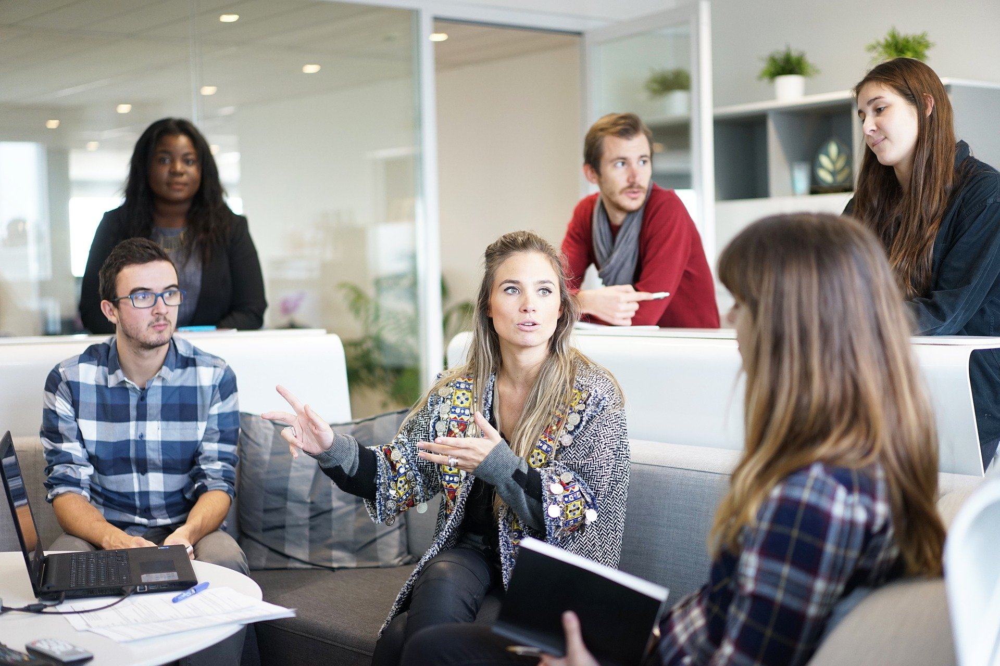

In [4]:
# Because google colab doesn't support cv2.imShow() we need to import it in a different format
from google.colab.patches import cv2_imshow
cv2_imshow(image)

In [ ]:
# Let's resize the image to process it fast
resize_image = cv2.resize(image, (800, 600))

In [ ]:
resize_image.shape

(600, 800, 3)

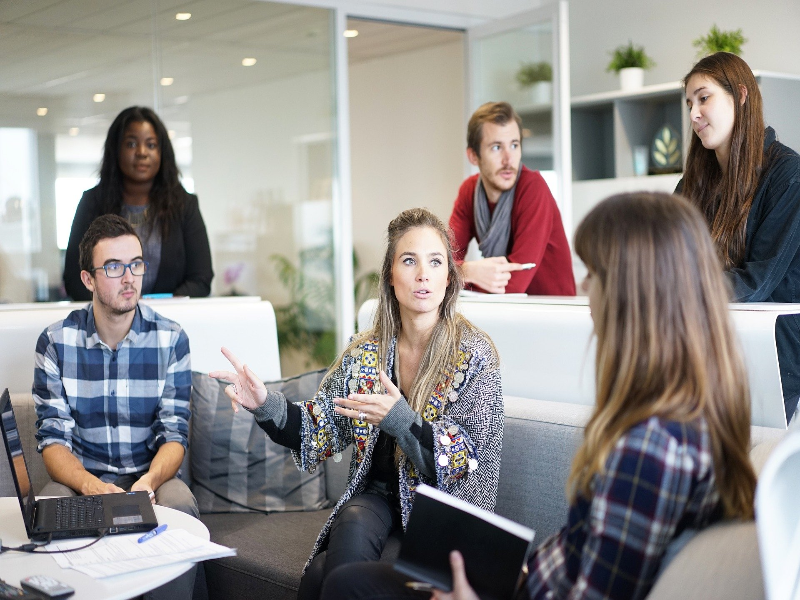

In [ ]:
cv2_imshow(resize_image)

In [ ]:
# Converting colored image to gray scaled image to reduce the image size
gray_image = cv2.cvtColor(resize_image, cv2.COLOR_BGR2GRAY)

In [ ]:
gray_image.shape

(600, 800)

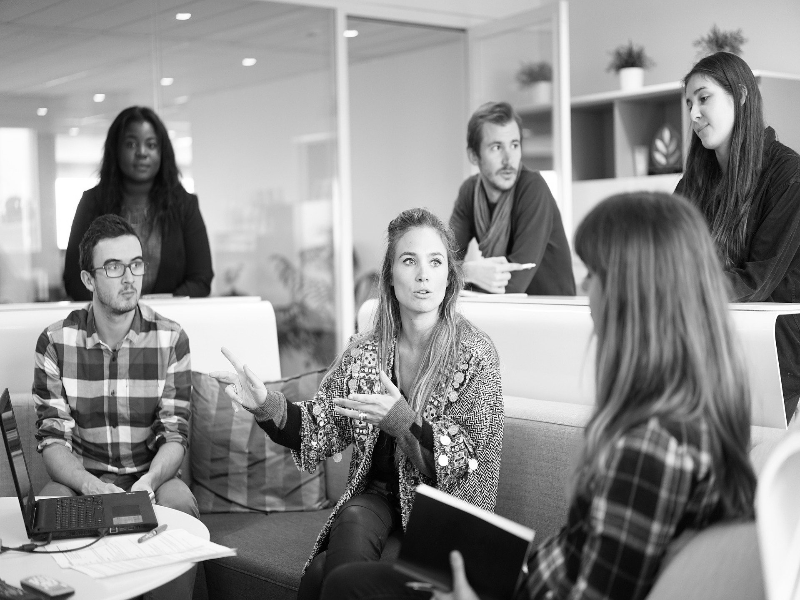

In [ ]:
cv2_imshow(gray_image)

### Detecting faces using cascase classifier

In [ ]:
face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')

In [ ]:
detections = face_detector.detectMultiScale(gray_image)

In [ ]:
detections

array([[677,  72,  68,  68],
       [115, 124,  53,  53],
       [475, 123,  59,  59],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66],
       [390, 323,  56,  56]], dtype=int32)

In [ ]:
len(detections)

6

677 72 68 68
115 124 53 53
475 123 59 59
387 233 73 73
92 239 66 66
390 323 56 56


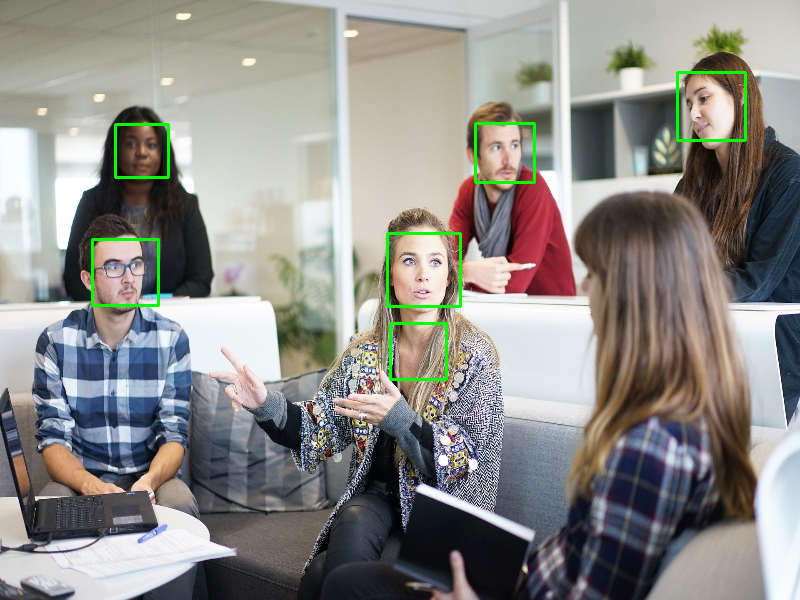

In [ ]:
for x, y, w, h in detections:
  print(x, y, w, h)
  cv2.rectangle(resize_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
cv2_imshow(resize_image)

### Haarcascade Parameter

678 74 65 65
113 122 56 56
475 122 60 60
90 238 69 69
386 232 74 74


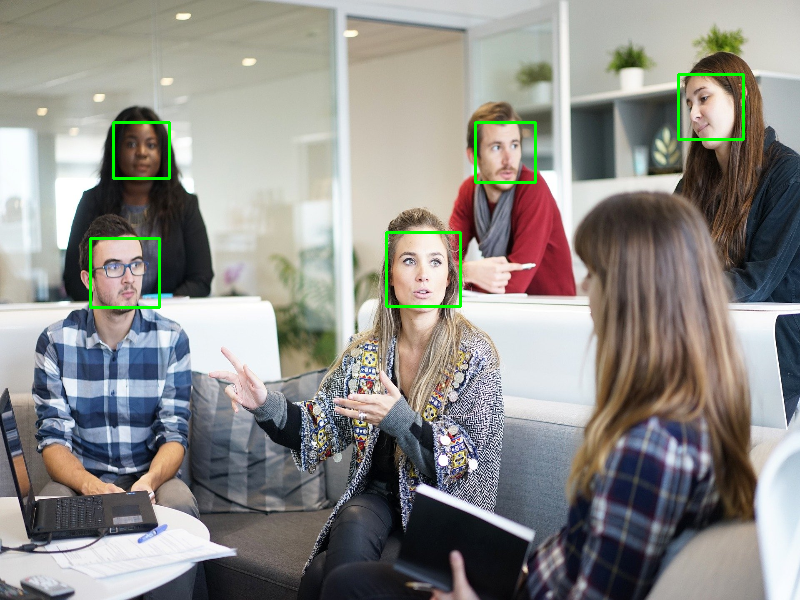

In [ ]:
# ScaleFactor - to say the size of the detection object

image = cv2.imread("/content/drive/MyDrive/Computer Vision Masterclass/Images/people1.jpg")
resize_image = cv2.resize(image, (800, 600))
gray_image = cv2.cvtColor(resize_image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(gray_image, scaleFactor = 1.09)

for x, y, w, h in detections:
  print(x, y, w, h)
  cv2.rectangle(resize_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
cv2_imshow(resize_image)

424 31 47 47
321 48 47 47
600 60 49 49
168 35 49 49
380 54 52 52
906 63 51 51
717 100 46 46
662 83 44 44
91 81 51 51
234 46 50 50
825 91 51 51
480 70 47 47


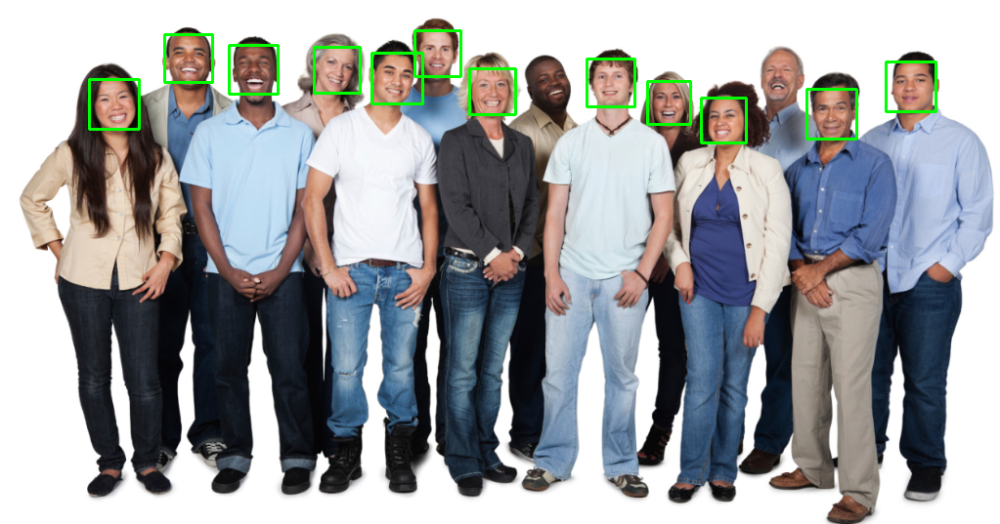

In [ ]:
# minNeighbors - min no of neighbours for the rectangle to be generated

image = cv2.imread("/content/drive/MyDrive/Computer Vision Masterclass/Images/people2.jpg")
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(gray_image, scaleFactor = 1.2, minNeighbors = 7)

for x, y, w, h in detections:
  print(x, y, w, h)
  cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
cv2_imshow(image)

### Eye detections

In [ ]:
eye_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_eye.xml')

1635 156 147 147
284 262 114 114
1149 260 129 129
928 491 171 171
222 507 151 151
1671 196 34 34
298 288 36 36
1223 299 24 24
351 298 25 25
1175 296 35 35
966 539 37 37
314 552 24 24
262 557 26 26
1026 541 38 38


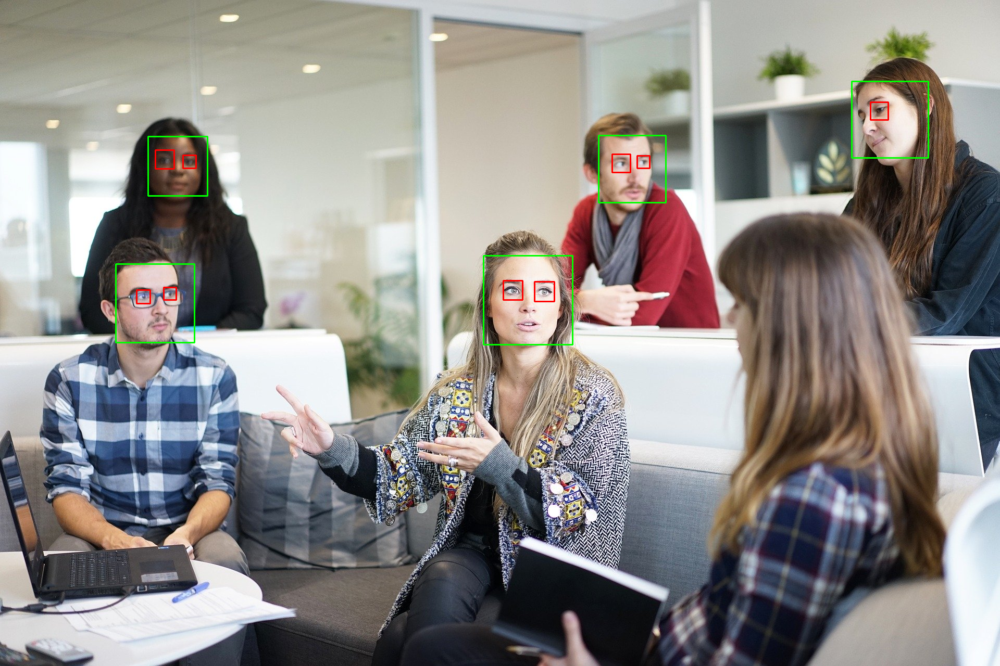

In [ ]:
image = cv2.imread("/content/drive/MyDrive/Computer Vision Masterclass/Images/people1.jpg")
# resize_image = cv2.resize(image, (800, 600))
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(gray_image, scaleFactor = 1.3, minSize=(30, 30))
eye_detections = eye_detector.detectMultiScale(gray_image, scaleFactor = 1.1, minNeighbors = 10, maxSize = (50, 50))

for x, y, w, h in detections:
  print(x, y, w, h)
  cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

for x, y, w, h in eye_detections:
  print(x, y, w, h)
  cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), 2)

cv2_imshow(image)

### Some other detections

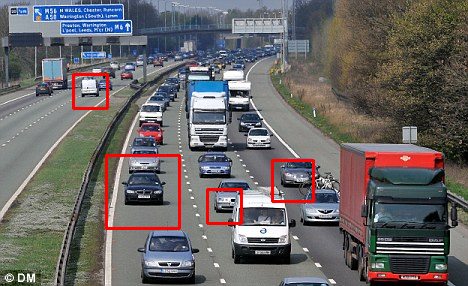

In [ ]:
car_image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/car.jpg')
gray_car_image = cv2.cvtColor(car_image, cv2.COLOR_BGR2GRAY)
car_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/cars.xml')
car_detections = car_detector.detectMultiScale(gray_car_image, scaleFactor = 1.05, minNeighbors = 5)
for x, y, w, h in car_detections:
  cv2.rectangle(car_image, (x, y), (x + w, y + h), (0, 0, 255), 2)

cv2_imshow(car_image)

### Clock Detection

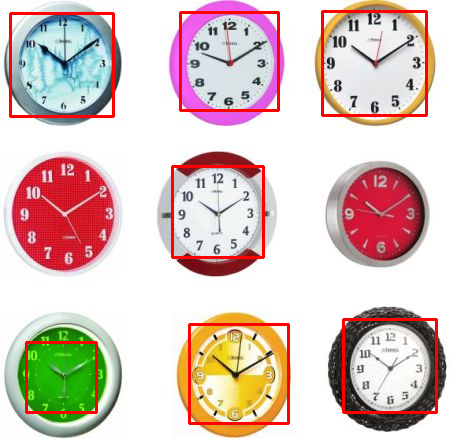

In [ ]:
clock_image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/clock.jpg')
gray_clock_image = cv2.cvtColor(clock_image, cv2.COLOR_BGR2GRAY)
clock_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/clocks.xml')
clock_detections = clock_detector.detectMultiScale(gray_clock_image, scaleFactor = 1.03, minNeighbors = 1)
for x, y, w, h in clock_detections:
  cv2.rectangle(clock_image, (x, y), (x + w, y + h), (0, 0, 255), 2)

cv2_imshow(clock_image)

### Full body detector

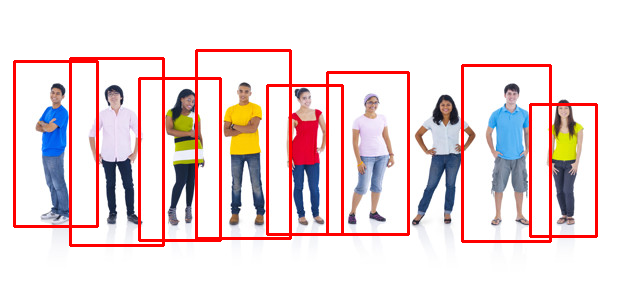

In [ ]:
body_image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people3.jpg')
gray_body_image = cv2.cvtColor(body_image, cv2.COLOR_BGR2GRAY)
body_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/fullbody.xml')
body_detections = body_detector.detectMultiScale(gray_body_image, scaleFactor = 1.05, minNeighbors = 5, minSize = (50, 50))
for x, y, w, h in body_detections:
  cv2.rectangle(body_image, (x, y), (x + w, y + h), (0, 0, 255), 2)

cv2_imshow(body_image)

## HOG - Histograms of Oriented Gradients

### We will be Dlib library here

In [6]:
import dlib

### Detecting faces with HOG

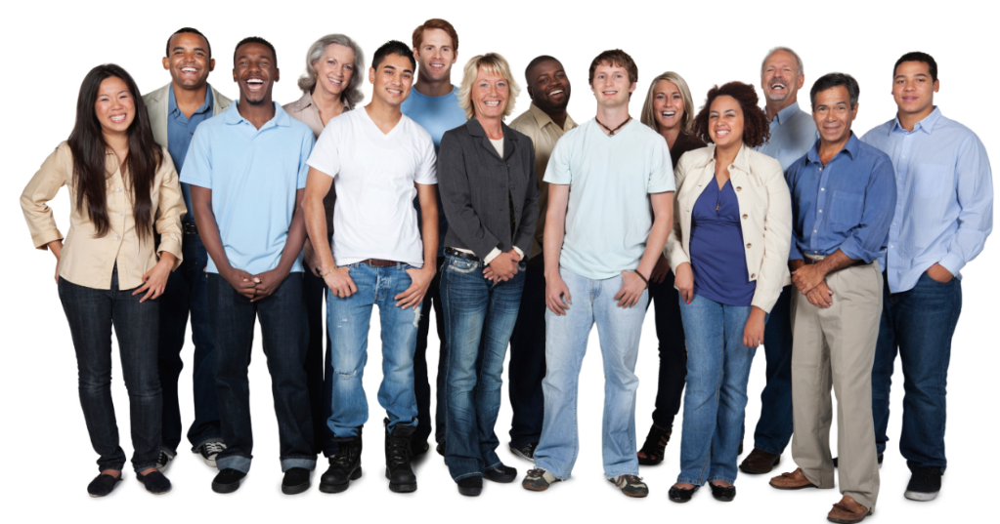

In [8]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people2.jpg')
cv2_imshow(image)

In [11]:
face_detector_hog = dlib.get_frontal_face_detector()
detections = face_detector_hog(image, 1)

In [12]:
detections

rectangles[[(429, 38) (465, 74)], [(665, 90) (701, 126)], [(717, 103) (760, 146)], [(909, 70) (952, 113)], [(828, 98) (871, 142)], [(605, 70) (641, 106)], [(777, 62) (813, 98)], [(485, 78) (521, 114)], [(386, 60) (429, 103)], [(170, 41) (213, 84)], [(93, 89) (136, 132)], [(237, 50) (280, 94)], [(323, 50) (367, 94)], [(544, 65) (588, 108)]]

In [15]:
for face in detections:
  l, t, r, b = face.left(), face.top(), face.right(), face.bottom()
  cv2.rectangle(image, (l, t), (r, b), (0, 0, 225), 2)

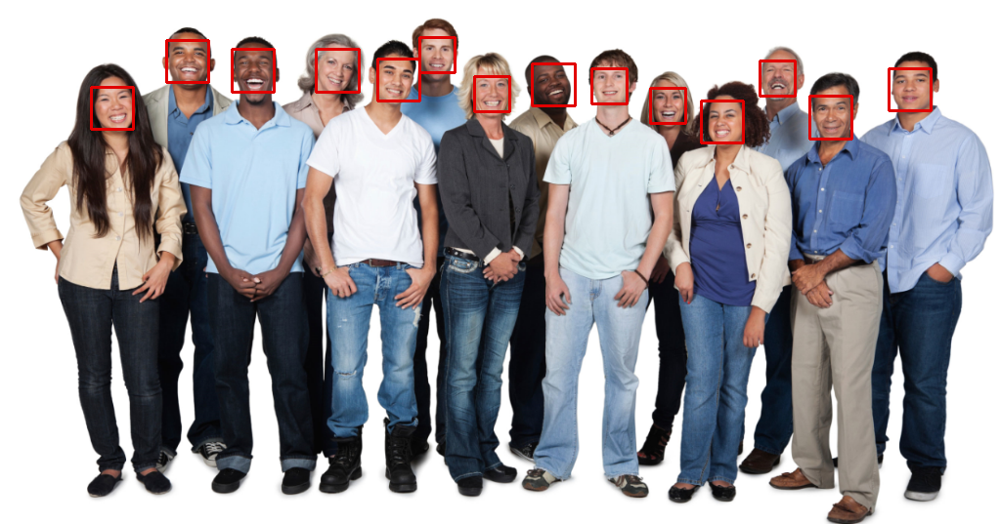

In [17]:
cv2_imshow(image)

## Detecting Faces Using CNN (Convolustional Nerual Networks)

In [7]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people2.jpg')
cnn_detector = dlib.cnn_face_detection_model_v1('/content/drive/MyDrive/Computer Vision Masterclass/Weights/mmod_human_face_detector.dat')

In [8]:
detections = cnn_detector(image, 1)

1.1440614461898804
1.137049913406372
1.1278995275497437
1.1200283765792847
1.1149375438690186
1.1131553649902344
1.0975688695907593
1.0942121744155884
1.085315227508545
1.0801889896392822
1.0800762176513672
1.0784764289855957
1.066403865814209
1.0641791820526123


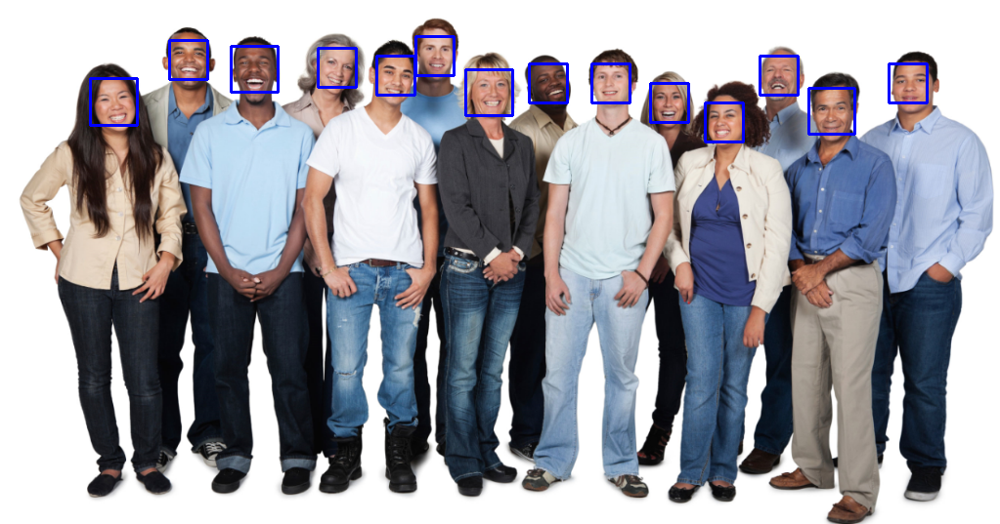

In [9]:
for face in detections:
  l, t, r, b, c = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence
  print(c)
  cv2.rectangle(image, (l, t), (r, b), (255, 0, 0), 2)
cv2_imshow(image)